In [1]:
using WAV, MFCC, DSP

In [10]:
readdir()

7-element Vector{String}:
 ".DS_Store"
 ".git"
 ".ipynb_checkpoints"
 "Sugar Plum Dark Mix.wav"
 "Untitled.ipynb"
 "Untitled1.ipynb"
 "onsets.jl"

In [15]:
filename = "Sugar Plum Dark Mix.wav"
f = wavread(filename)

([-3.051850947599719e-5 3.051850947599719e-5; 6.103701895199438e-5 6.103701895199438e-5; … ; 0.0 3.051850947599719e-5; 3.051850947599719e-5 -3.051850947599719e-5], 44100.0f0, 0x0010, WAVChunk[WAVChunk(Symbol("fmt "), UInt8[0x10, 0x00, 0x00, 0x00, 0x01, 0x00, 0x02, 0x00, 0x44, 0xac, 0x00, 0x00, 0x10, 0xb1, 0x02, 0x00, 0x04, 0x00, 0x10, 0x00]), WAVChunk(:LIST, UInt8[0x49, 0x4e, 0x46, 0x4f, 0x49, 0x4e, 0x41, 0x4d, 0x14, 0x00  …  0x65, 0x2d, 0x31, 0x2e, 0x30, 0x2e, 0x33, 0x31, 0x29, 0x00]), WAVChunk(Symbol("id3 "), UInt8[0x49, 0x44, 0x33, 0x03, 0x00, 0x00, 0x00, 0x00, 0x02, 0x5d  …  0x50, 0x72, 0x6f, 0x20, 0x38, 0x2e, 0x30, 0x2e, 0x32, 0x00])])

In [16]:
f = f[1]
#mel = mfcc(f[:,1], 44100)
f = f[:,1]

5532527-element Vector{Float64}:
 -3.051850947599719e-5
  6.103701895199438e-5
 -6.103701895199438e-5
  0.0
  0.0
 -9.155552842799158e-5
  9.155552842799158e-5
 -9.155552842799158e-5
  9.155552842799158e-5
 -9.155552842799158e-5
  3.051850947599719e-5
 -9.155552842799158e-5
  0.00012207403790398877
  ⋮
  0.0
 -3.051850947599719e-5
  6.103701895199438e-5
 -6.103701895199438e-5
  3.051850947599719e-5
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  3.051850947599719e-5

In [4]:
w = hanning(2048)
x_square = f.^2
energy_local = conv(x_square, w.^2)

186308-element Vector{Float64}:
  4.3298697960381105e-15
  4.468647674116255e-15
 -6.38378239159465e-16
  2.3314683517128287e-15
  2.345346139520643e-15
 -8.049116928532385e-16
  1.8041124150158794e-15
  2.1649348980190553e-15
 -1.7763568394002505e-15
  1.942890293094024e-15
  3.913536161803677e-15
  4.343747583845925e-15
  1.0547118733938987e-15
  ⋮
  3.4359953664158904e-11
  2.1976861306014387e-11
  1.3436916556850004e-11
  7.775290534362963e-12
  4.198509921982567e-12
  2.0724164619153575e-12
  9.05991973795065e-13
  3.330614964064728e-13
  9.37289307943565e-14
  1.6501417681221286e-14
  9.735107043983859e-16
 -1.541982788425858e-18

In [18]:
using Plots, ImageFiltering, Statistics, LinearAlgebra
plot( mapwindow(mean,energy_local, 1111))
println(length(energy_local))
function local_mean(x,M)
    if M < 2
        return ArgumentError("M must be > 1")
    end
    conv(x,rect(M)/M)[M ÷ 2 : length(x)+M÷2-1]
end
H = 21000
length(local_mean(1:120,59))

LoadError: UndefVarError: energy_local not defined

In [9]:
energy_local_diff = diff(energy_local)
push!(energy_local_diff,0)
#plot(energy_local_diff)

LoadError: UndefVarError: energy_local not defined

In [10]:
novelty_energy = copy(energy_local_diff)
novelty_energy[energy_local_diff .< 0] .= 0
plot(mapwindow(mean,novelty_energy,21121))


LoadError: UndefVarError: energy_local_diff not defined

In [24]:
#adapted from https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_NoveltyEnergy.html
function compute_novelty_energy(x, Fs=1, N=2048, H=128, gamma=10.0, norm=true)
    w = hanning(N)
    Fs_feature = Fs / H
    energy_local = conv(x.^2, w.^2,)
    energy_local = energy_local[1:H:length(energy_local)]
    if gamma != nothing
        energy_local = log.(1 .+ gamma .* energy_local)
    end
    energy_local_diff = diff(energy_local)
    push!(energy_local_diff,0)
    novelty_energy = copy(energy_local_diff)
    novelty_energy[energy_local_diff .< 0] .= 0
    if norm
        max_value = maximum(novelty_energy)
        if max_value > 0
            novelty_energy = novelty_energy / max_value
        end
    end
    return novelty_energy, Fs_feature
end


compute_novelty_energy (generic function with 6 methods)

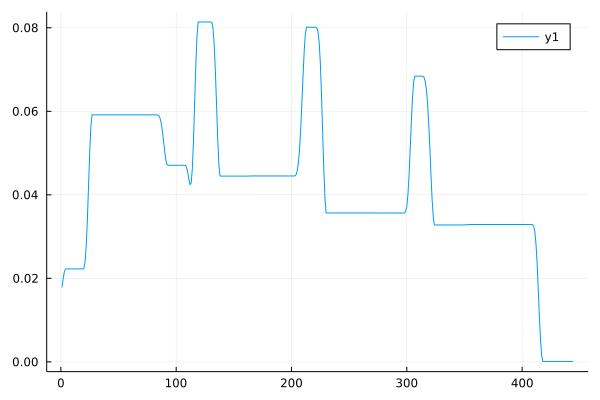

In [27]:
x = wavread("queen.wav")
x = x[1]
fs = 22050.0
N = 2048
H = 128
nov_1, Fs_nov  = compute_novelty_energy(x, fs, N, H, nothing)
nov_2, Fs_nov = compute_novelty_energy(x, fs, N, H,1000)
plot(mapwindow(mean, nov_1, 111))
#plot!(nov_2)

#print(Fs_nov)

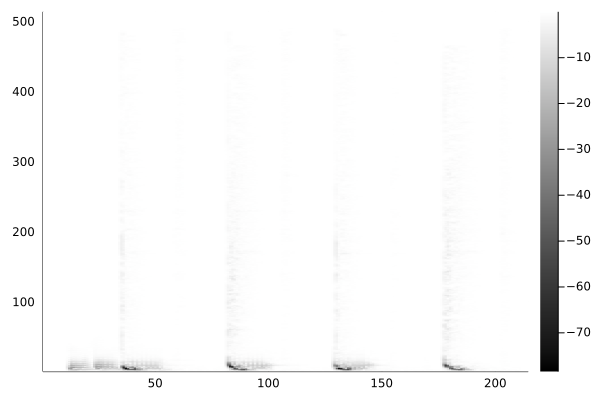

In [1228]:




x = wavread("queen.wav")
x = x[1][:]

Fs = 22050.0
N, H = 1024, 256
noverlap = N - H
X = stft(x,N,noverlap+4,window=hanning,nfft=N)
y = abs.(X)
heatmap(-y, color = :greys,)



In [40]:
function compute_local_average(x, M)
    #==Compute local average of signal

    Notebook: C6/C6S1_NoveltySpectral.ipynb

    Args:
        x (np.ndarray): Signal
        M (int): Determines size (2M+1) in samples of centric window  used for local average

    Returns:
        local_average (np.ndarray): Local average signal
    =##
    L = length(x)
    local_average = zeros(L)
    for m in 1:L
        a = max(m - M, 1)
        b = min(m + M + 1, L)
        local_average[m] = (1 ./ (2 .* M + .1)) .* sum(x[a:b])
    end
    return local_average
end


x = 1:inv(41000):10
@time compute_local_average(x,13)
@time mapwindow(mean,x,27)

  0.099557 seconds (66.69 k allocations: 7.031 MiB, 34.37% compilation time)
  0.023164 seconds (220 allocations: 2.835 MiB)


369001-element Vector{Float64}:
 1.000082204155375
 1.0000948509485095
 1.0001084010840107
 1.0001228545618788
 1.0001382113821138
 1.0001544715447155
 1.0001716350496839
 1.0001897018970187
 1.000208672086721
 1.0002285456187896
 1.0002493224932247
 1.000271002710027
 1.000293586269196
 ⋮
 9.999728997289973
 9.999750677506777
 9.99977145438121
 9.99979132791328
 9.99981029810298
 9.999828364950316
 9.999845528455285
 9.999861788617885
 9.99987714543812
 9.999891598915989
 9.999905149051491
 9.999917795844626

\

In [1237]:
M_sec = 0.1
M = Int(ceil(M_sec * Fs_nov))
local_average = compute_local_average(nov, M)
nov_norm =  nov[:] - local_average

nov_norm[nov_norm .< 0] .=0
nov_norm = nov_norm ./ maximum(nov_norm)
(local_average)
(mapwindow(mean, nov, 2M+1,))

LoadError: syntax: misplaced assignment statement in "[border = "replicate"]" around In[1237]:9

def compute_novelty_spectrum(x, Fs=1, N=1024, H=256, gamma=100.0, M=10, norm=True):
    """Compute spectral-based novelty function

    Notebook: C6/C6S1_NoveltySpectral.ipynb

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 1024)
        H (int): Hop size (Default value = 256)
        gamma (float): Parameter for logarithmic compression (Default value = 100.0)
        M (int): Size (frames) of local average (Default value = 10)
        norm (bool): Apply max norm (if norm==True) (Default value = True)

    Returns:
        novelty_spectrum (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    """
    X = librosa.stft(x, n_fft=N, hop_length=H, win_length=N, window='hanning')
    Fs_feature = Fs / H
    Y = np.log(1 + gamma * np.abs(X))
    Y_diff = np.diff(Y)
    Y_diff[Y_diff < 0] = 0
    novelty_spectrum = np.sum(Y_diff, axis=0)
    novelty_spectrum = np.concatenate((novelty_spectrum, np.array([0.0])))
    if M > 0:
        local_average = compute_local_average(novelty_spectrum, M)
        novelty_spectrum = novelty_spectrum - local_average
        novelty_spectrum[novelty_spectrum < 0] = 0.0
    if norm:
        max_value = max(novelty_spectrum)
        if max_value > 0:
            novelty_spectrum = novelty_spectrum / max_value
    return novelty_spectrum, Fs_feature

nov, Fs_nov = compute_novelty_spectrum(x, Fs=Fs, N=1024, H=256, gamma=10, M=10, norm=True)
fig, ax, line = libfmp.b.plot_signal(nov, Fs_nov, color='k', 
                    title='Spectral-based novelty function with normalization')
libfmp.b.plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

nov, Fs_nov = libfmp.c6.compute_novelty_energy(x, Fs=Fs, N=1024, H=256, gamma=10)
fig, ax, line = libfmp.b.plot_signal(nov, Fs_nov, color='k',
                    title='Energy-based novelty function with normalization')
libfmp.b.plot_annotation_line(ann, ax=ax, label_keys=label_keys,
                    nontime_axis=True, time_min=0, time_max=x_duration);

In [4]:
function compute_novelty_spectrum(x, Fs=1, N=1024, H=256, gamma=100.0, M=10, norm=true)
    #==Compute spectral-based novelty function

    Notebook: C6/C6S1_NoveltySpectral.ipynb

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 1024)
        H (int): Hop size (Default value = 256)
        gamma (float): Parameter for logarithmic compression (Default value = 100.0)
        M (int): Size (frames) of local average (Default value = 10)
        norm (bool): Apply max norm (if norm==True) (Default value = True)

    Returns:
        novelty_spectrum (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    ==#
    X = stft(x, N, H)
    Fs_feature = Fs / H
    Y = log.(1 .+ gamma .* abs.(X))
    Y_diff = diff(Y,dims = 1)
    Y_diff[Y_diff .< 0] .= 0
    novelty_spectrum = sum(Y_diff, dims = 1)
    
    novelty_spectrum = vcat(novelty_spectrum, transpose(zeros(length(novelty_spectrum[1,:]))))
    if M > 0
        local_average = compute_local_average(novelty_spectrum, M)
        novelty_spectrum = novelty_spectrum[:] - local_average
        novelty_spectrum[novelty_spectrum .< 0] .= 0
    end
    if norm
        max_value = maximum(novelty_spectrum)
        if max_value > 0
            novelty_spectrum = novelty_spectrum ./ max_value
        end
    end
    return novelty_spectrum, Fs_feature
end


compute_novelty_spectrum (generic function with 7 methods)

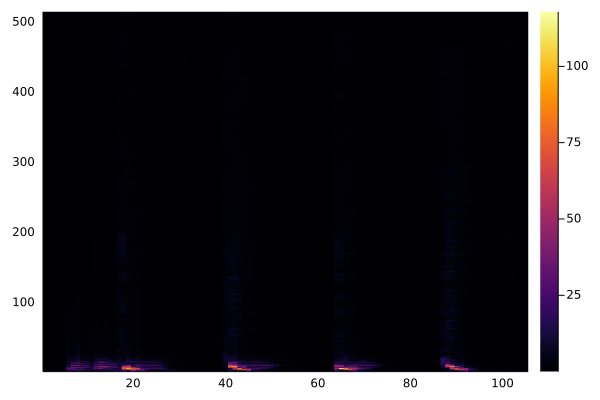

In [425]:
x = wavread("queen.wav")
x = x[1][:]
data, fs = compute_novelty_energy(x)
plot(data)
M_sec = 0.1
Fs_nov = fs/256
M = Int(ceil(M_sec * Fs_nov))
X = stft(x, N, H*2)
local_average = compute_local_average(nov, M)
plot(local_average)
heatmap(abs.(X))

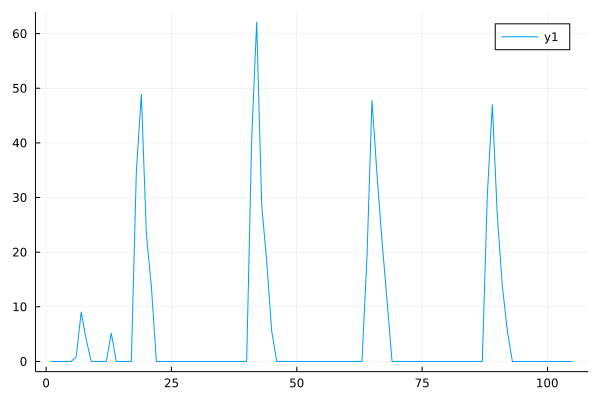

In [522]:
k= spectrogram(x,1024)
a1 = sum(k.power,dims=1)
a2 = compute_local_average(a1,10)
#plot(a1-a2)
a2 = reshape(a2,1,105)
a2 = a1-a2
a2[a2 .< 0] .= 0
 
plot(a2[:])

In [537]:
function peak_picking_simple(x, threshold=nothing)
    #==Peak picking strategy looking for positions with increase followed by descrease

    Notebook: C6/C6S1_PeakPicking.ipynb

    Args:
        x (1d vector): Input function
        threshold (float): Lower threshold for peak to survive

    Returns:
        peaks vector: Array containing peak positions
    =##
    peaks = []
    if threshold == nothing
        threshold = minimum(x) - 1
    end
    for i in 2:length(x)
        if x[i - 1] < x[i] && x[i] > x[i + 1]
            if x[i] >= threshold
                push!(peaks,i)
            end
        end
    end
    return peaks
end
#==
def plot_function_peak_positions(nov, Fs_nov, peaks, title='', figsize=(8,2)):
    peaks_sec = peaks/Fs_nov
    fig, ax, line = libfmp.b.plot_signal(nov, Fs_nov, figsize=figsize, color='k', title=title);
    plt.vlines(peaks_sec, 0, 1.1, color='r', linestyle=':', linewidth=1);

peaks = peak_picking_simple(nov, threshold=None)
title='Simple peak picking (without threshold condition)'
plot_function_peak_positions(nov, Fs_nov, peaks, title)

threshold = 0.2
peaks = peak_picking_simple(nov, threshold=threshold)
title='Simple peak picking (threshold=%.1f)'%threshold
plot_function_peak_positions(nov, Fs_nov, peaks, title)
plt.hlines(threshold, 0, x_duration, color='cyan', linewidth=2);
plt.legend(['Novelty function',  'Peak positions',  'Global threshold'], 
           loc='upper right', framealpha=1);
=##
        

peak_picking_simple (generic function with 2 methods)

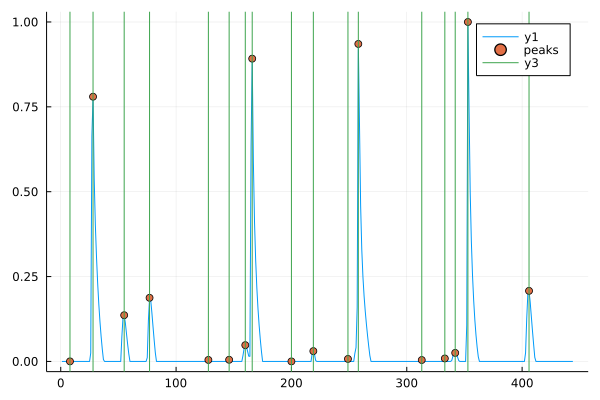

In [542]:
peaks = peak_picking_simple(nov_2)
plot(nov_2)
nov_2[peaks]
scatter!(peaks,nov_2[peaks],label=["peaks" "."])
vline!(peaks)

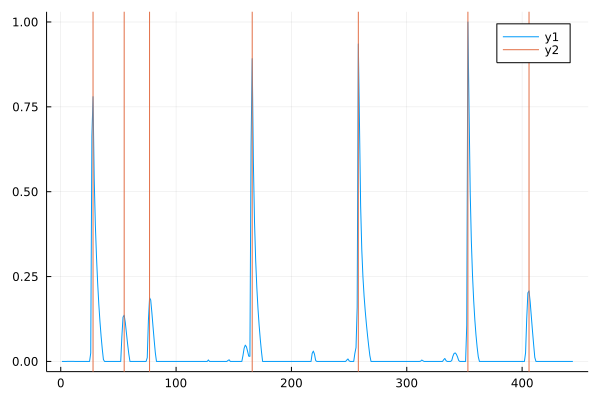

In [546]:
peaks = peak_picking_simple(nov_2, .1)
plot(nov_2)
vline!(peaks)

In [12]:
using LinearAlgebra
function median_filter(x,median_len)
    isodd(median_len) ? mapwindow(median, x, median_len)  : mapwindow(median, x, median_len+1) 
    
end
function peak_picking_MSAF(x, median_len=16, offset_rel=0.05, sigma=4.0)
    offset = mean(x) * offset_rel
    x = gaussian_filter(x, sigma)
    threshold_local = median_filter(x, median_len) .+ offset
    peaks = []
    for i in 2:length(x)-1
        if x[i - 1] < x[i] && x[i] > x[i + 1]
            if x[i] > threshold_local[i]
                push!(peaks,i)
            end
        end
    end
    
    return peaks, x, threshold_local
end
       

                
                
                
                
median_len = 16
sigma = 4
peaks, x_smooth, threshold_local = peak_picking_MSAF(Transpose(novelty_energy),median_len, 0.05, sigma)
plot(nov_2,color = "cyan")
plot!(x_smooth,color = "blue")
plot!(threshold_local,color = "blue")
vline!(peaks)
#==   
title='MSAF peak picking (sigma=%1.0f, median_len=%2.0f)'%(sigma, median_len)
plot_function_peak_positions(nov, Fs_nov, peaks, title)

t = np.arange(nov.shape[0]) / Fs_nov 
plt.plot(t, x_smooth, color='magenta', linewidth=2);
plt.plot(t, threshold_local, color='cyan', linewidth=2);
plt.legend(['Novelty function', 'Smoothed Novelty', 'Local threshold'], 
           loc='upper right', framealpha=1);

median_len = 16
sigma = 4
peaks, x_smooth, threshold_local = peak_picking_MSAF(nov, median_len=median_len, 
                                                     offset_rel=0.05, sigma=sigma)
title='MSAF peak picking (sigma=%1.0f, median_len=%2.0f)'%(sigma, median_len)
plot_function_peak_positions(nov, Fs_nov, peaks, title)
t = np.arange(nov.shape[0]) / Fs_nov 
plt.plot(t, x_smooth, color='magenta', linewidth=2);
plt.plot(t, threshold_local, color='cyan', linewidth=2);
plt.legend(['Novelty function',  'Smoothed Novelty', 'Local threshold'], 
           loc='upper right', framealpha=1);
    ==#


LoadError: UndefVarError: novelty_energy not defined

In [19]:
#gaussian()
a = LinRange(0,1,41000)
a = a*4000 .|> sin

#@time gaus = gaussian(5,.4)./sum(gaussian(5,.4))
function gauss(σ::Real, l::Int = 4*ceil(Int,σ)+1)
    #isodd(l) || throw(ArgumentError("length must be odd"))
    w = l>>1
    g = σ == 0 ? [exp(0/(2*oftype(σ, 1)^2))] : [exp(-x^2/(2*σ^2)) for x=-w:w]
    centered(g/sum(g))
end
function gaussian_filter(x,σ)
    return (conv(gauss(σ),x)[1:length(x)])
    #==conv is slow
    and i was unable to convolve with filters
    if speed is an issue,
    replace code with imfilter from image filtering
    ==#
end


gaussian_filter (generic function with 1 method)

In [71]:
function scipy_gauss(M,σ)
    
    n = collect(0:M-1) .- (M-1.0)/2.0
    σ₂ = 2 * σ * σ
    w = exp.(-n .^ 2 ./ σ₂)
end
#gauss(.4,3)

scipy_gauss (generic function with 1 method)

In [74]:
scipy_gauss(12,.5)-gaussian(12,.5)

12-element Vector{Float64}:
 -0.6065306597126334
 -0.715545032256701
 -0.8167033564371866
 -0.9018474319921106
 -0.9523839781108256
 -0.389345634802865
 -0.389345634802865
 -0.9523839781108256
 -0.9018474319921106
 -0.8167033564371866
 -0.715545032256701
 -0.6065306597126334

In [70]:
M=7
n = collect(0:M-1) .- (M-1.0)/2.0

#gauss(sigma, 4)-ker


7-element Vector{Float64}:
 -3.0
 -2.0
 -1.0
  0.0
  1.0
  2.0
  3.0

In [965]:
#an(a1) = (1+(4(ceil(a1))))
ax(x) = 4*ceil(Int,x)+1

ax (generic function with 1 method)

In [1145]:
noisy = y1[1:1000] .+ rand(1000)/100

filtered = gaussian_filter(filtered,.3)
kernel = kernel.gaussian(.3)
#plot(noisy)
plot(filtered)

LoadError: UndefVarError: kernel not defined

In [1154]:
using ImageFiltering
function gaussian_filter1d(x,σ=2)
    imfilter(x,ImageFiltering.Kernel.gaussian((σ,)))
end
function median_filter1d

end
filtered = mapwindow(median, noisy, 19)

In [1211]:
plot(novelty_energy)

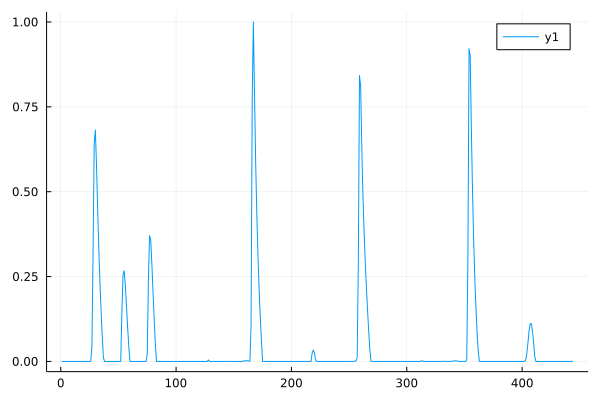

In [1287]:
x1, fs = (compute_novelty_energy(x),1)
#plot(x)
#plot!(x |> diff )
plot(x1[1])

#plot!(compute_novelty_energy(x) |> Transpose)

#typeof(x)

In [1308]:
function medfilt(;input_range::Array, input_signal::Array, window::Int64)

    median_signal::Array{Float64} = []
    for i in 1:length(input_range)
        if length(input_range) - (window + i - 1) < 0
            forward = input_signal[i:end]
            wrap = input_signal[1:abs(length(input_signal) - (window + i - 1))]
            append!(median_signal, median(vcat(forward, wrap)))
        else
            forward = input_signal[i:(window + i - 1)]
            append!(median_signal, median(forward))
        end

    end
    return median_signal
end
medfilt1d(input,window) = medfilt(input_range = input, input_signal = input, window = window)


medfilt1d (generic function with 1 method)

In [1363]:
input = x
#output = medfilt(, input,10)
a1 = medfilt1d(collect(1:1:20),2)
a2 = median_filter(collect(1:1:20),2)
a1

20-element Vector{Float64}:
  1.5
  2.5
  3.5
  4.5
  5.5
  6.5
  7.5
  8.5
  9.5
 10.5
 11.5
 12.5
 13.5
 14.5
 15.5
 16.5
 17.5
 18.5
 19.5
 10.5

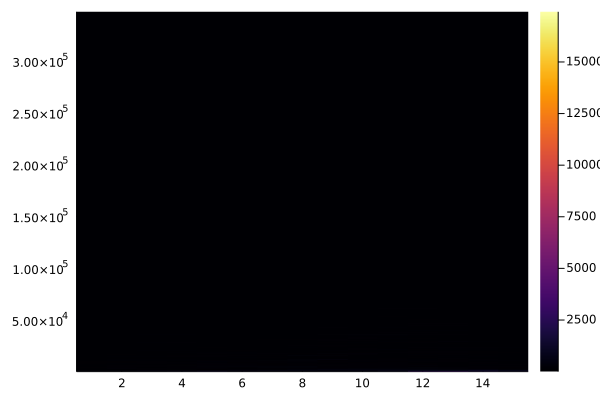

In [26]:
N =
heatmap(abs.(stft(f N, H*2))))
